In [1]:
%matplotlib inline

## Load the CIFTI file and get the data

In [7]:
import nilearn
import hcp_utils as hcp
import nibabel as nib
import nilearn.plotting as plotting
import numpy as np
import pandas as pd
nib.imageglobals.logger.level = 40

init_dir='/Users/jsein/Documents/Centre_IRMf/DATA/BIDS/BRAINT'
cifti_func=init_dir+"/derivatives/fmriprep/sub-011/ses-02/func/sub-011_ses-02_task-03ArchiLocalizer_space-fsLR_den-91k_bold.dtseries.nii"
cifti = nib.load(cifti_func)
X = cifti.get_fdata()
X.shape  

(317, 91282)

## Standardize data
  => Each grayordinate has zero (temporal) mean and unit standard deviation:

In [4]:
Xn = hcp.normalize(X)
#pd.options.mode.chained_assignment = None
#Xn[np.isnan(Xn)] = 0

## Define the mask2d function that is not (yet) in hcp_utils

In [5]:
def mask2d(X, mask, fill=0):
    """
    Takes 1D data `X` and a mask `mask`. Sets the exterior of mask to a constant (by default zero).
    Can be useful for visualization.
    """
    X_masked = np.zeros_like(X)
    X_masked[:,:] = fill
    X_masked[:,mask] = X[:,mask]
    return X_masked

## Apply the mask to the standardized CIFTI data
Here we chose the parcel #2 of the Yeo7 atlas

The atlas looks like that:

In [8]:
hcp.view_parcellation(hcp.mesh.inflated, hcp.yeo7)

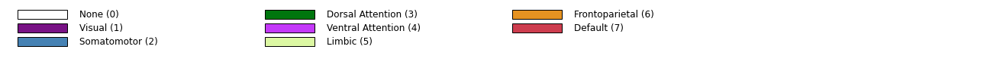

In [9]:
hcp.parcellation_labels(hcp.yeo7)

The region #2 is is the somatomotor area

## Mask the data

In [12]:
Xn_masked = mask2d(Xn,hcp.yeo7.map_all==2)

## Plot the data
since it is a 2D, one has to pick a time point for visualization

In [13]:
plotting.view_surf(hcp.mesh.inflated, 
    hcp.cortex_data(Xn_masked[0]), 
    threshold=0.1, bg_map=hcp.mesh.sulc)